In [43]:
import os
import pickle
import itertools
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

import morph_analyses as m


%load_ext autoreload
%autoreload 2

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Load all place cell info for test sessions

In [4]:
load_previous = True # load precomputed place cell data

if not load_previous:
    morphbin = np.linspace(-.11,1.11,num=11)
    datadict = {}
    for session_dict in (m.mouse_metadata.rare_sessions, m.mouse_metadata.frequent_sessions):

        for mouse, metadata in session_dict.items():
            datadict[mouse]={}

            for i, sess_deets in enumerate(metadata['test_sessions']):
                sess = m.sess.CA1MorphSession.from_nwb(mouse, 'testing', sess_deets['day'])
                datadict[mouse][i] = {
                    'masks':sess.place_cell_info['masks'],
                    'S_trial_mat': sess.trial_matrices['spks_norm'],
                    'trial_info': sess.trial_info,
                    'pvals': sess.place_cell_info['p']
                    }
                
    with open(m.params.data_dir / "place_cell_results.pkl","wb") as f:
        pickle.dump(datadict,f)   
else:
    with open(m.params.data_dir / "place_cell_results.pkl","rb") as f:
        datadict = pickle.load(f)

### Plot data

In [56]:
def plot_all_place_cells(mice, common_pc_only=False):
    getSort = lambda fr : np.argsort(np.argmax(fr,axis=1))
    pc_dict = {}
    for _m in [0,.25,.5,.75,1]:
        pc_dict[_m] = {}
        for mm in [0,.25,.5,.75,1]:
            pc_dict[_m][mm]=[]
    
    comm0,comm1 = [],[]       
    for mouse in mice: 
        for sess in datadict[mouse].keys():
            pvals = datadict[mouse][sess]['pvals']
            masks={}
            if not common_pc_only:
                for k, p in pvals.items():
                    masks[k] = pvals[k]<.05
            else:
                mask = (pvals[0]<.05) & (pvals[1]<.05)
                for k, p in pvals.items():
                    masks[k] = mask
                    
                pcs = datadict[mouse][sess]['S_trial_mat'][:,:,mask]
                comm0.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==0,:,:],axis=0))
                comm1.append(np.nanmean(pcs[datadict[mouse][sess]['trial_info']['morphs']==1,:,:],axis=0))

            _pc_dict = m.place_cell_analysis.plot_placecells(
                m.utilities.trial_type_dict(datadict[mouse][sess]['S_trial_mat'],
                                            datadict[mouse][sess]['trial_info']['morphs']),
                masks,plot=False)
            for _m in _pc_dict.keys():
                for mm in _pc_dict.keys():
                    pc_dict[_m][mm].append(_pc_dict[_m][mm])
                    
                    
            
                    
    f,ax = plt.subplots(5,5,figsize=[5*5,7*5])
    f.subplots_adjust(wspace=.1,hspace=.1)
    for i,_m in enumerate(pc_dict.keys()):
        sort = getSort(np.concatenate(pc_dict[_m][_m],axis=0))
        for j,mm in enumerate(pc_dict.keys()):
            pc_dict[_m][mm] = np.concatenate(pc_dict[_m][mm],axis=0)
            print(pc_dict[_m][mm].shape)
            pc_dict[_m][mm] = pc_dict[_m][mm][sort,:]
            
            ax[i,j].imshow(pc_dict[_m][mm],aspect='auto',cmap='pink',vmin=.2,vmax=.9)
            if j>0:
                ax[i,j].set_yticks([])
            ax[i,j].set_xticks([])

            if j==0:
                ax[i,j].set_ylabel(f'cells (sorted by S={_m})')
            ax[i,j].set_xlabel('Position')

            if i==0:
                ax[i,j].set_title(f'S={mm}')
    
    if not common_pc_only:
        return f, ax
    else:
        comm0 = np.concatenate(comm0,axis=-1)
        comm1 = np.concatenate(comm1,axis=-1)
        return f, ax, comm0, comm1

(11606, 45)
(11606, 45)
(11606, 45)
(11606, 45)
(11606, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7420, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7633, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(7694, 45)
(10608, 45)
(10608, 45)
(10608, 45)
(10608, 45)
(10608, 45)


Text(0.5, 0.98, 'Rare mice')

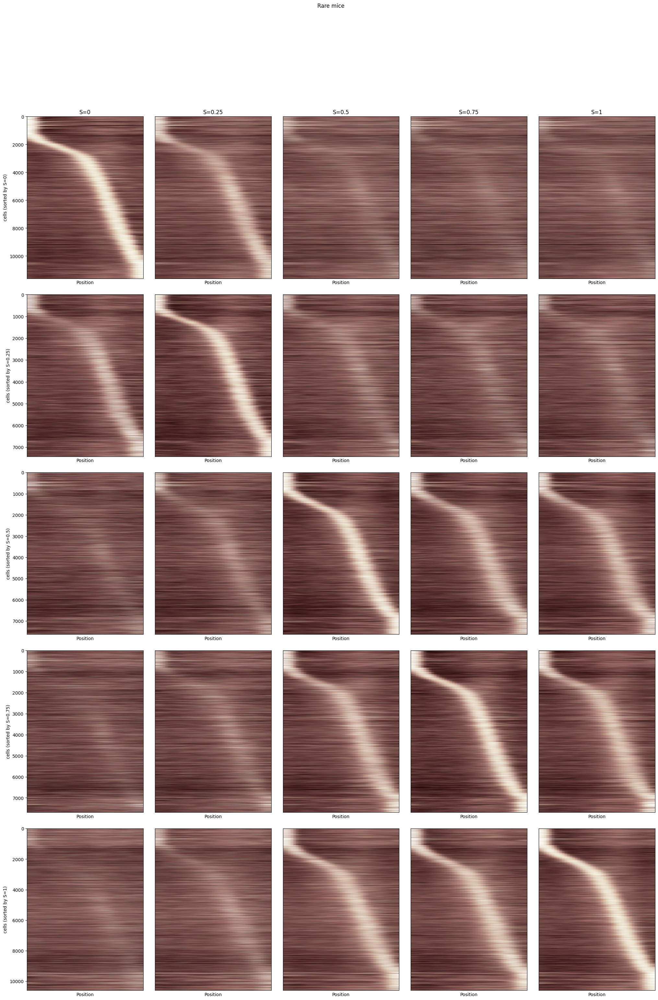

In [54]:
f, ax = plot_all_place_cells(m.mouse_metadata.rare_mice)
f.suptitle('Rare mice')

(5522, 45)
(5522, 45)
(5522, 45)
(5522, 45)
(5522, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(4498, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5026, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5158, 45)
(5365, 45)
(5365, 45)
(5365, 45)
(5365, 45)
(5365, 45)


Text(0.5, 0.98, 'Frequent mice')

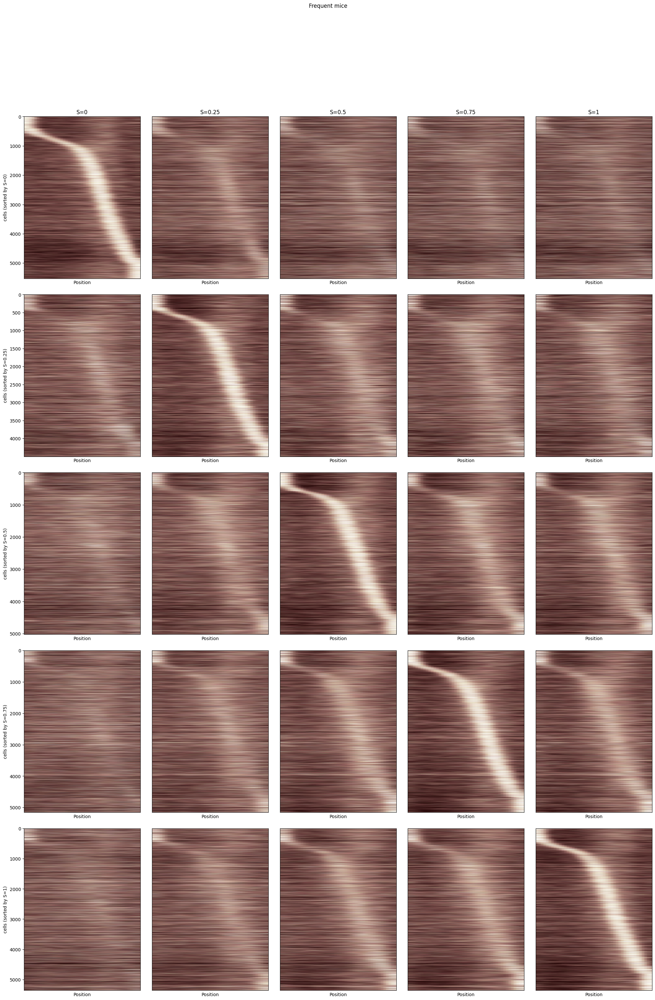

In [7]:
f, ax = plot_all_place_cells(m.mouse_metadata.frequent_mice)
f.suptitle('Frequent mice')

In [12]:
datadict['R1'][0].keys()

dict_keys(['masks', 'S_trial_mat', 'trial_info', 'pvals'])

### Calculate place cell similarity matrices

In [21]:
mouselabel = []
rarefreqlabel = []
SM = []
SM_norm = []
sesslabel =[]
for mi, mouse in enumerate(m.mouse_metadata.rare_mice + m.mouse_metadata.frequent_mice):
    for si, (sess, sessdict) in enumerate(datadict[mouse].items()):
        # load data
        
        # OR mask
        for _i, (morph,mask) in enumerate(sessdict['masks'].items()):
            if _i == 0:
                ormask = mask
            else:
                ormask+=mask
        ormask = ormask>0
        
        # bin by morph value
        S_trial_mat = np.copy(sessdict['S_trial_mat'][:,:,ormask])
        S_binmat = np.zeros([5,*S_trial_mat.shape[1:]])
        for _i, _m in enumerate(sessdict['masks'].keys()):
            S_binmat[_i,:,:] = S_trial_mat[sessdict['trial_info']['morphs']==_m,:,:].mean(axis=0)
        S_binmat[np.isnan(S_binmat)] = 1E-3
        S_binmat = S_binmat/(np.linalg.norm(S_binmat,ord=2,axis=1,keepdims=True)+1E-3)

        # similarity matrix 
        sm = np.matmul(np.transpose(S_binmat,axes=(2,0,1)),np.transpose(S_binmat,axes=(2,1,0)))

        sm_norm = np.copy(sm)
        sm_norm[:,[0,1,2,3,4],[0,1,2,3,4]]=np.nan
        sm_norm = (sm_norm-np.nanmean(sm_norm))/np.nanstd(sm_norm)

        # save mouse and session index
        SM.append(sm)
        SM_norm.append(sm_norm)
        mouselabel.append(mi*np.ones((sm.shape[0],)))
        sesslabel.append(si*np.ones((sm.shape[0],)))
        if mouse in m.mouse_metadata.rare_mice:
            rarefreqlabel.append(np.ones((sm.shape[0],)))
        else:
            rarefreqlabel.append(np.zeros((sm.shape[0],)))
    
SM = np.concatenate(SM,axis=0)
SM_norm = np.concatenate(SM_norm,axis=0)
mouselabel = np.concatenate(mouselabel)
rarefreqlabel = np.concatenate(rarefreqlabel)
sesslabel = np.concatenate(sesslabel)

/tmp/ipykernel_205204/3502643490.py:16: RuntimeWarning: Mean of empty slice
  muf,mur = np.nanmean(SM_norm[rarefreqlabel==0,:,:],axis=0),np.nanmean(SM_norm[rarefreqlabel==1,:,:],axis=0)


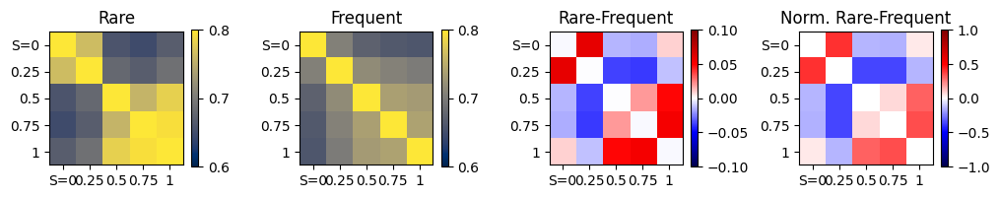

In [37]:
f,ax = plt.subplots(1,4,figsize= [12,3])
muf,mur = SM[rarefreqlabel==0,:,:].mean(axis=0),SM[rarefreqlabel==1,:,:].mean(axis=0)
diff = mur-muf
im=ax[0].imshow(mur,cmap='cividis',vmin=.6,vmax=.8)
ax[0].set_title('Rare')
f.colorbar(im, shrink=.6)
im = ax[1].imshow(muf,cmap='cividis',vmin=.6,vmax=.8)
ax[1].set_title('Frequent')
f.colorbar(im, shrink=.6)
im = ax[2].imshow(diff,cmap='seismic',vmin=-.1,vmax=.1)
f.colorbar(im, shrink=.6)
ax[2].set_title('Rare-Frequent')



muf,mur = np.nanmean(SM_norm[rarefreqlabel==0,:,:],axis=0),np.nanmean(SM_norm[rarefreqlabel==1,:,:],axis=0)
diff = mur-muf
im=ax[3].imshow(diff,cmap='seismic',vmin=-1,vmax=1)
f.colorbar(im, shrink=.6)
ax[3].set_title('Norm. Rare-Frequent')

f.subplots_adjust(wspace=.5)
for a in ax.flatten():
    a.set_xticks([0,1,2,3,4], labels = ['S=0', '0.25', '0.5', '0.75', '1'])
    a.set_yticks([0,1,2,3,4], labels = ['S=0', '0.25', '0.5', '0.75', '1'])


In [38]:
# Rare place cell numbers for main text

num = 0
den = 0
orcount = 0
andcount = 0 
count0,count1 = 0,0
for mouse in m.mouse_metadata.rare_mice: 
    print(mouse)
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        allmask = masks[0]
        
        orcount += (masks[0]|masks[1]).sum()
        andcount += (masks[0]&masks[1]).sum()
        count0+= masks[0].sum()
        count1+=masks[1].sum()
        print(allmask.shape)
        for k,mask in masks.items():
            allmask = allmask|mask
        
        num += allmask.sum()
        den += allmask.shape[0]
print("Total number of place cells: %f" % num,"Pecent: %f" % (num/den))
print("0 pcnt %f" % (count0/den),"1 pcnt %f" % (count1/den),"random ovlp %f" % (count0/den*count1/den),"actual ovlp %f" %(andcount/den))
# print("0 pcnt %f" % (count0/num),"1 pcnt %f" % (count1/num),"random ovlp %f" % (count0/num*count1/num),"actual ovlp %f" %(andcount/num))

R1
(1828,)
(1904,)
(1817,)
(1708,)
(1715,)
R2
(1632,)
(1656,)
(1515,)
(1650,)
(1498,)
(1631,)
R3
(915,)
(976,)
(984,)
(932,)
(1047,)
R4
(886,)
(919,)
(1035,)
(1074,)
(940,)
R5
(1194,)
R6
(2652,)
(1403,)
(1617,)
Total number of place cells: 21614.000000 Pecent: 0.615293
0 pcnt 0.330392 1 pcnt 0.301981 random ovlp 0.099772 actual ovlp 0.119335


In [40]:
# Frequent place cell numbers for main text

num = 0
den = 0
orcount = 0
andcount = 0 
count0,count1 = 0,0
for mouse in m.mouse_metadata.frequent_mice: 
    print(mouse)
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        allmask = masks[0]
        
        orcount += (masks[0]|masks[1]).sum()
        andcount += (masks[0]&masks[1]).sum()
        count0+= masks[0].sum()
        count1+=masks[1].sum()
        print(allmask.shape)
        for k,mask in masks.items():
            allmask = allmask|mask
        
        num += allmask.sum()
        den += allmask.shape[0]
print("Total number of place cells: %f" % num,"Pecent: %f" % (num/den))
print("0 pcnt %f" % (count0/den),"1 pcnt %f" % (count1/den),"random ovlp %f" % (count0/den*count1/den),"actual ovlp %f" %(andcount/den))

F1
(301,)
(273,)
(237,)
F2
(2127,)
(2149,)
(2046,)
(2006,)
F3
(161,)
F4
(1963,)
(1998,)
(2047,)
(2117,)
(1901,)
F5
(309,)
(571,)
(326,)
(311,)
(257,)
F6
(3297,)
(2875,)
(2746,)
Total number of place cells: 14479.000000 Pecent: 0.482344
0 pcnt 0.183956 1 pcnt 0.178726 random ovlp 0.032878 actual ovlp 0.048837


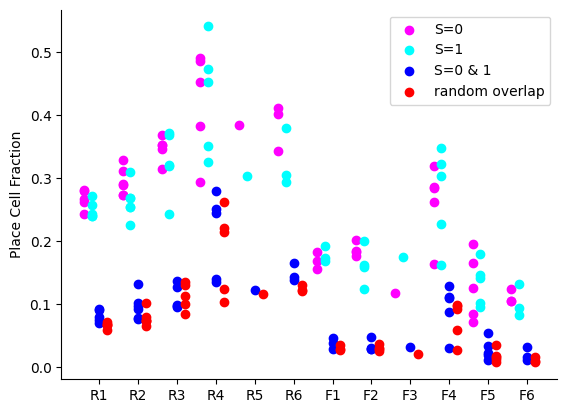

In [50]:
# common place cell numbers for main text
mice = m.mouse_metadata.rare_mice + m.mouse_metadata.frequent_mice
count0,count1 = [[]]*len(mice),[[]]*len(mice)

randovlp,actlovlp= [[]]*len(mice),[[]]*len(mice)
randovlp_all,actlovlp_all = [],[]
for _m,mouse in enumerate(mice): 
#     
    count0[_m],count1[_m],randovlp[_m],actlovlp[_m]=[],[],[],[]
    for sess in datadict[mouse].keys():
        pvals = datadict[mouse][sess]['pvals']
        masks={}
        for k, p in pvals.items():
            masks[k] = pvals[k]<.05
        
        count0[_m].append(masks[0].mean())
#         print(m,masks[0].mean())
        count1[_m].append(masks[1].mean())
        randovlp[_m].append(masks[0].mean()*masks[1].mean())
        actlovlp[_m].append((masks[0]&masks[1]).mean())
        
        randovlp_all.append(masks[0].mean()*masks[1].mean())
        actlovlp_all.append((masks[0]&masks[1]).mean())
    # print(mouse,count0[_m])


f, ax = plt.subplots()
for _m in range(len(mice)):
#     print(len(count0[m]))
#     jit = .3*(np.random.rand()-.5)
    if _m ==0:
        ax.scatter(_m*np.ones([len(count0[_m]),])-.4,count0[_m],color=plt.cm.cool(1.), label='S=0')
        ax.scatter(_m*np.ones([len(count1[_m]),])-.2,count1[_m],color=plt.cm.cool(0.), label='S=1')
        ax.scatter(_m*np.ones([len(count1[_m]),])+0,actlovlp[_m],color='blue', label='S=0 & 1')
        ax.scatter(_m*np.ones([len(count1[_m]),])+.2,randovlp[_m],color='red', label='random overlap')
    else:
        ax.scatter(_m*np.ones([len(count0[_m]),])-.4,count0[_m],color=plt.cm.cool(1.))
        ax.scatter(_m*np.ones([len(count1[_m]),])-.2,count1[_m],color=plt.cm.cool(0.))
        ax.scatter(_m*np.ones([len(count1[_m]),])+0,actlovlp[_m],color='blue')
        ax.scatter(_m*np.ones([len(count1[_m]),])+.2,randovlp[_m],color='red')

ax.legend(loc='upper right')
ax.set_xticks(np.arange(len(mice)))
ax.set_xticklabels(['R1','R2','R3','R4','R5','R6','F1','F2','F3','F4','F5','F6'])

ax.set_ylabel('Place Cell Fraction')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


46
47.0 6.181721801112872e-10
-7.826214407509711 6.178666851384066e-10
-7.826214407509711 6.178666851384066e-10


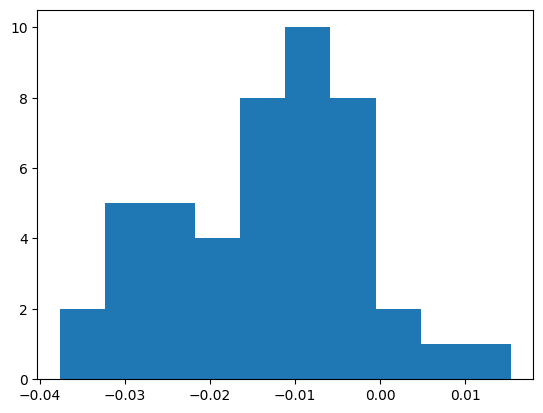

In [51]:
f,ax = plt.subplots()
print(len(randovlp_all))
ax.hist(np.array(randovlp_all)-np.array(actlovlp_all))
# print(np.array(randovlp_all).mean())
stat,p = sp.stats.wilcoxon(np.array(randovlp_all)-np.array(actlovlp_all))
print(stat,p)
t,p = sp.stats.ttest_rel(np.array(randovlp_all),np.array(actlovlp_all))
print(t,p)
t,p = sp.stats.ttest_1samp(np.array(randovlp_all)-np.array(actlovlp_all),0)
print(t,p)

### Plot common place cells in both tracks

(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)
(4192, 45)


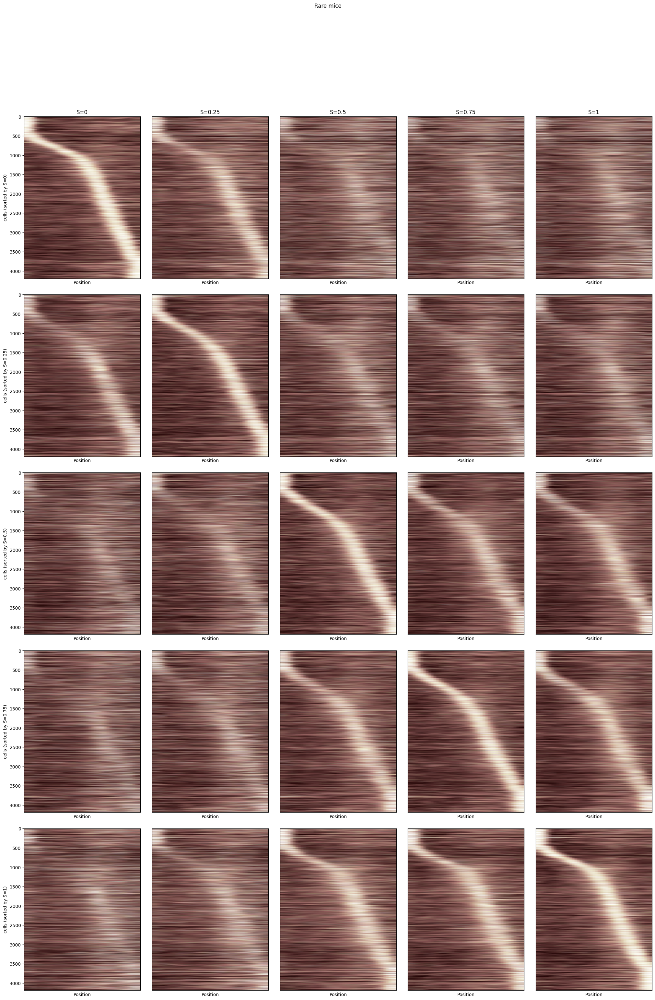

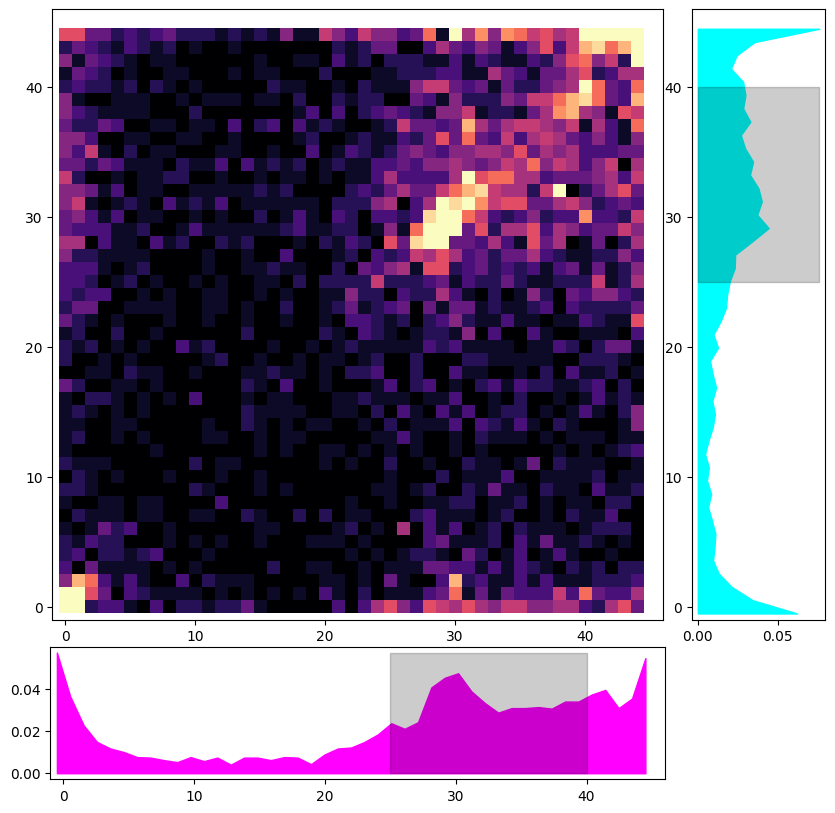

In [58]:
f, ax, comm0, comm1 = plot_all_place_cells(
    m.mouse_metadata.rare_mice, 
    common_pc_only=True)
f.suptitle('Rare mice')

f,ax = m.place_cell_analysis.common_cell_remap_heatmap(comm0,comm1,norm=False)

(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)
(1466, 45)


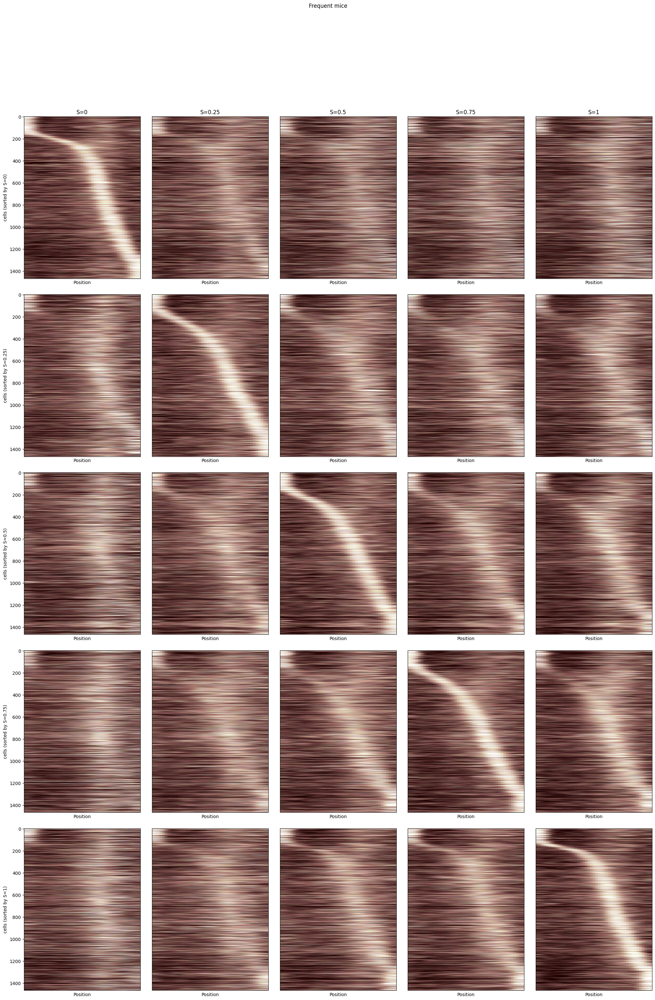

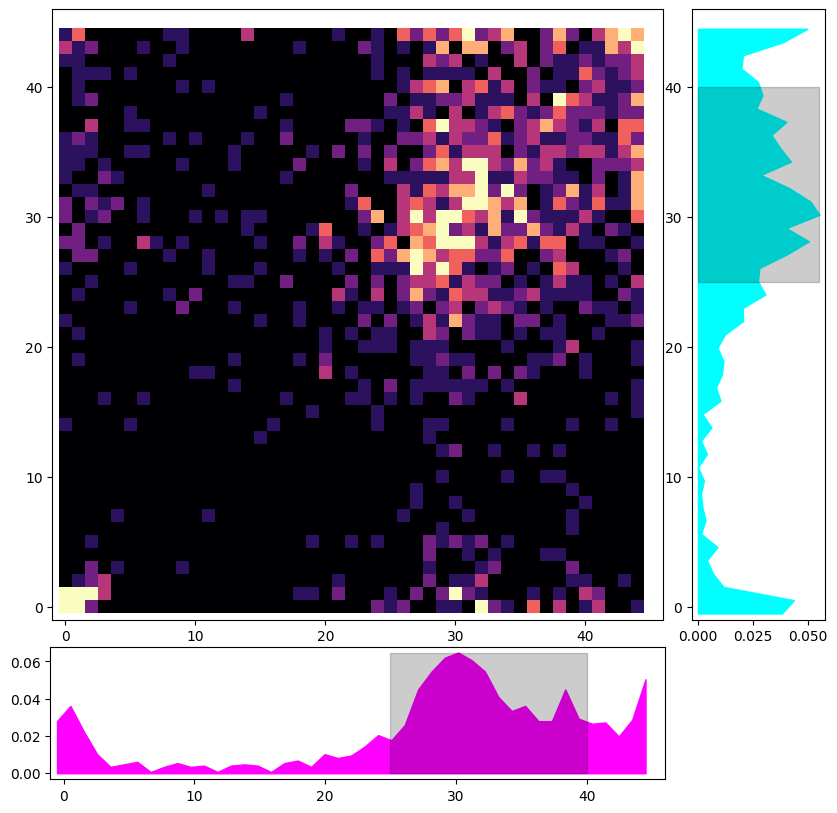

In [60]:
f, ax, comm0, comm1 = plot_all_place_cells(
    m.mouse_metadata.frequent_mice, 
    common_pc_only=True)
f.suptitle('Frequent mice')

f,ax = m.place_cell_analysis.common_cell_remap_heatmap(comm0,comm1,norm=False)